Reading eigenvalues from test_EW_results.jld2
Exact eigenvalue number 5: -312.3898360930738


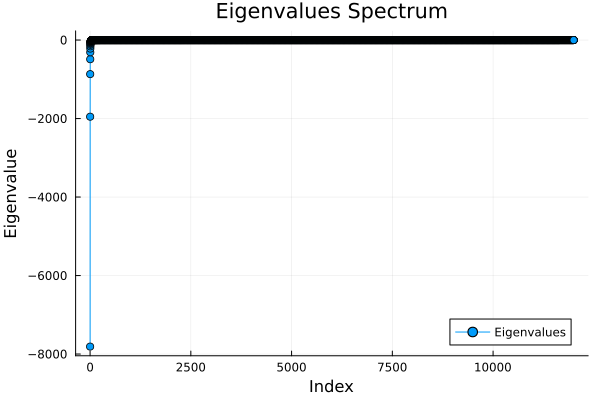

In [68]:
using LinearAlgebra
using JLD2

function read_eigenresults(name::String)
    println("Reading eigenvalues from $name")
    data = jldopen(name, "r")
    eigenvalues = data["eigenvalues"]
    close(data)
    return sort(eigenvalues)
end

EV = read_eigenresults("test_EW_results.jld2")
N = length(EV)
number = 5
println("Exact eigenvalue number $number: ", EV[number])

using Plots

plot(1:N, EV, xlabel="Index", ylabel="Eigenvalue", title="Eigenvalues Spectrum", marker=:circle, label="Eigenvalues")

Reading eigenvalues from ../Eigenvalues_folder/eigenres_formaldehyde_RNDbasis1.jld2
Fitted α = -853.7142494929915
Fitted β = 0.10931396203607915


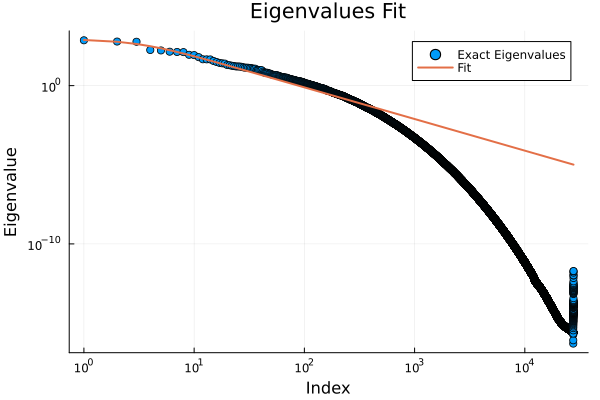

In [63]:
using LsqFit
using Plots
using JLD2


function read_eigenresults(molecule::String)
    output_file = "../Eigenvalues_folder/eigenres_" * molecule * "_RNDbasis1.jld2"
    println("Reading eigenvalues from $output_file")
    data = jldopen(output_file, "r")
    eigenvalues = data["eigenvalues"]
    close(data)
    return sort(eigenvalues)
end

# Define your fitting model
model(x, p) = p[1] ./ (1 .+ p[2] .* x.^2)

Σexact = read_eigenresults("formaldehyde")

# Prepare data for fitting
xdata = collect(1:length(Σexact))
ydata = Σexact

# Initial guess for parameters: e.g. alpha = 1.0, beta = 0.01
p0 = [1.0, 0.01]
weights = 1.0 ./ ydata.^2


# Perform the fit
fit = curve_fit(model, xdata, ydata, p0)

# Extract fitted parameters
α_fit, β_fit = fit.param

println("Fitted α = $α_fit")
println("Fitted β = $β_fit")

# Plotting
scatter(xdata, abs.(ydata), label="Exact Eigenvalues", xlabel="Index", ylabel="Eigenvalue", title="Eigenvalues Fit", marker=:circle)
plot!(xdata, abs.(model(xdata, fit.param)), label="Fit", lw=2)
plot!(xscale=:log10, yscale=:log10, legend=:topright)


In [1]:
using Random

x = rand()
x

0.6146482221858466

In [1]:
using JLD2

function load_eigenresults(output_file)
    # Unpack directly into variables
    data = load(output_file)  # Returns a Dict-like object
    Σexact = data["Σexact"]  # Access by key
    Uexact = data["Uexact"]
    return Σexact, Uexact
end

# Usage
Σexact, Uexact = load_eigenresults("eigen_results_hBN.jld2")
println("Loaded Σexact (first 5 eigenvalues): ", Σexact[1:5])

ArgumentError: ArgumentError: No file exists at given path: eigen_results_hBN.jld2

Test time Transformation

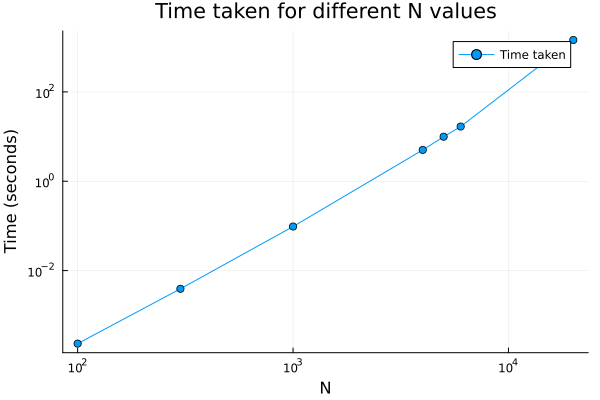

In [2]:
Ns = [100, 300, 1000, 4000, 5000, 6000, 20000]

times = [0.000232, 0.003914, 0.096913, 5.025422, 9.929093, 16.774097, 1453.430445]

using Plots
plot(Ns, times, marker=:circle, label="Time taken", xlabel="N", ylabel="Time (seconds)", title="Time taken for different N values")
xaxis!(:log10)
yaxis!(:log10)

In [10]:
using LinearAlgebra

function define_matrix(N)
    # Define a simple matrix for demonstration
    return rand(N, N)  # Replace with actual matrix definition as needed
end

A = define_matrix(4)
D = diag(A)
display(D)

diagonal_matrix = Diagonal(D) |> Matrix
Hermitian_matrix = Hermitian(diagonal_matrix)
display(Hermitian_matrix)

4-element Vector{Float64}:
 0.7407965268396386
 0.603662439109599
 0.6081542789506111
 0.7527680465118339

4×4 Hermitian{Float64, Matrix{Float64}}:
 0.740797  0.0       0.0       0.0
 0.0       0.603662  0.0       0.0
 0.0       0.0       0.608154  0.0
 0.0       0.0       0.0       0.752768